## Setup

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras import layers
from keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout
from keras import models
from keras import activations
from keras.activations import relu, sigmoid
from keras import losses
from keras import regularizers
from keras import optimizers

from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator

from keras.applications import VGG16

IMAGE_SIZE = 150
CAT_FILENAME_PATTERN = 'cat.{}.jpg'
DOG_FILENAME_PATTERN = 'dog.{}.jpg'

base_dir = os.path.expanduser('~/data/kaggle/dogs-vs-cats')
orig_data_dir = os.path.join(base_dir, 'train')

small_dir = os.path.join(base_dir, 'small')
os.makedirs(small_dir, exist_ok=True)

models_dir = os.path.join(small_dir, 'models')
os.makedirs(models_dir, exist_ok=True)

train_dir = os.path.join(small_dir, 'train')
os.makedirs(train_dir, exist_ok=True)
valid_dir = os.path.join(small_dir, 'validation')
os.makedirs(valid_dir, exist_ok=True)
test_dir = os.path.join(small_dir, 'test')
os.makedirs(test_dir, exist_ok=True)

train_dogs_dir = os.path.join(train_dir, 'dogs')
os.makedirs(train_dogs_dir, exist_ok=True)
train_cats_dir = os.path.join(train_dir, 'cats')
os.makedirs(train_cats_dir, exist_ok=True)
valid_dogs_dir = os.path.join(valid_dir, 'dogs')
os.makedirs(valid_dogs_dir, exist_ok=True)
valid_cats_dir = os.path.join(valid_dir, 'cats')
os.makedirs(valid_cats_dir, exist_ok=True)
test_dogs_dir = os.path.join(test_dir, 'dogs')
os.makedirs(test_dogs_dir, exist_ok=True)
test_cats_dir = os.path.join(test_dir, 'cats')
os.makedirs(test_cats_dir, exist_ok=True)


def plot_history(history):
    hist_dict = history.history
    loss_values = hist_dict['loss']
    val_loss_values = hist_dict['val_loss']
    acc_values = hist_dict['acc']
    val_acc_values = hist_dict['val_acc']

    epochs = range(1, len(loss_values) + 1)

    fig, (ax0, ax1) = plt.subplots(nrows=2, ncols=1,
                                   sharex='all', figsize=(10, 7))
    ax0.plot(epochs, loss_values, 'bo')
    ax0.plot(epochs, val_loss_values, 'b+')
    ax0.set_ylabel('Loss')

    ax1.plot(epochs, acc_values, 'bo')
    ax1.plot(epochs, val_acc_values, 'b+')
    ax1.set_ylabel('Accuracy')

    plt.show()

Using TensorFlow backend.


In [2]:
vgg16 = VGG16(weights='imagenet',
              include_top=False,
              input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

img_path = os.path.join(test_cats_dir, CAT_FILENAME_PATTERN.format(1700))

from keras.preprocessing import image

img = image.load_img(img_path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255

print(img_tensor.shape)

(1, 150, 150, 3)


In [3]:
%matplotlib inline

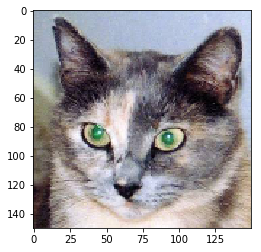

In [4]:
plt.imshow(img_tensor[0]);

In [5]:
vgg16.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

## Do something

In [16]:
layer_outputs = [layer.output for layer in vgg16.layers]
activation_model = models.Model(inputs=vgg16.input, outputs=layer_outputs)

In [18]:
activation_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

In [19]:
activation_output = activation_model.predict(img_tensor)

In [20]:
len(activation_output)

19

In [21]:
first_layer_activation = activation_output[1]
first_layer_activation.shape

(1, 150, 150, 64)

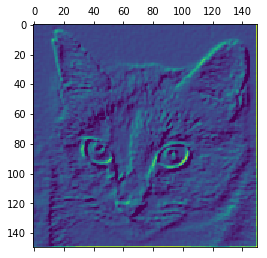

In [34]:
plt.matshow(first_layer_activation[0, :, :, 0], cmap='viridis');

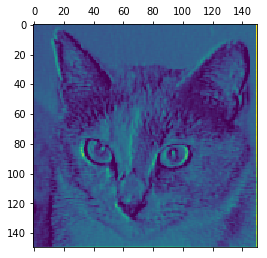

In [35]:
plt.matshow(first_layer_activation[0, :, :, 2], cmap='viridis');

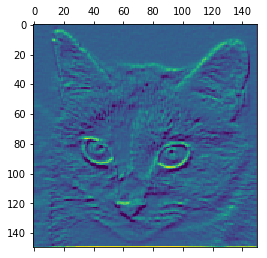

In [37]:
plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis');

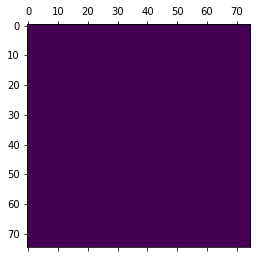

In [38]:
plt.matshow(activation_output[4][0, :, :, 0], cmap='viridis');

/home/eantaev/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


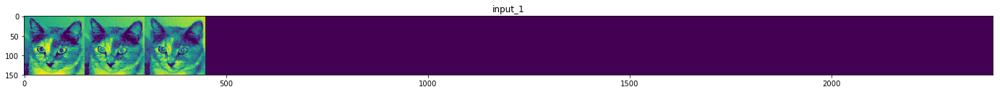

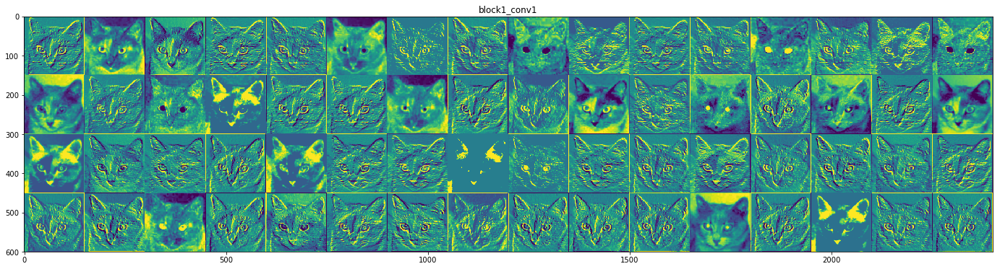

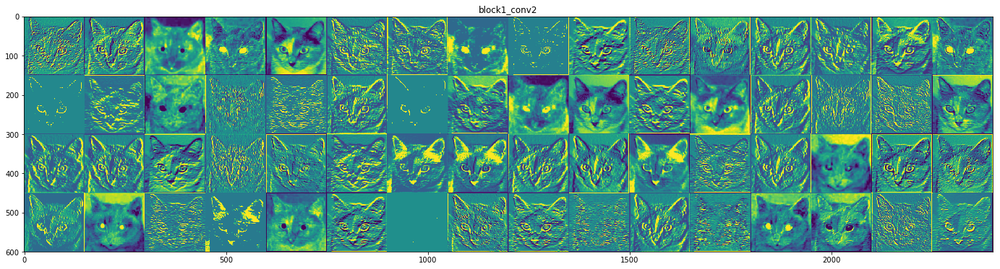

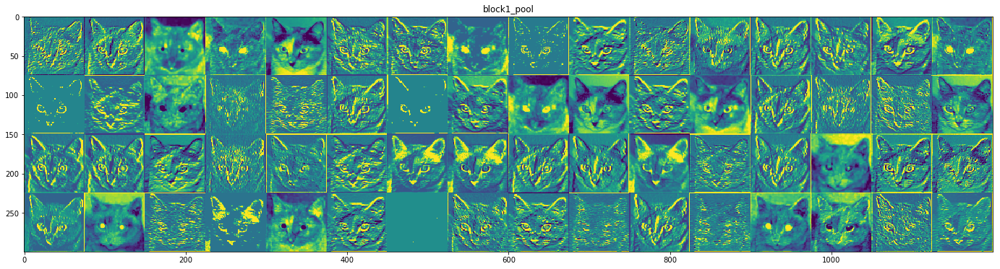

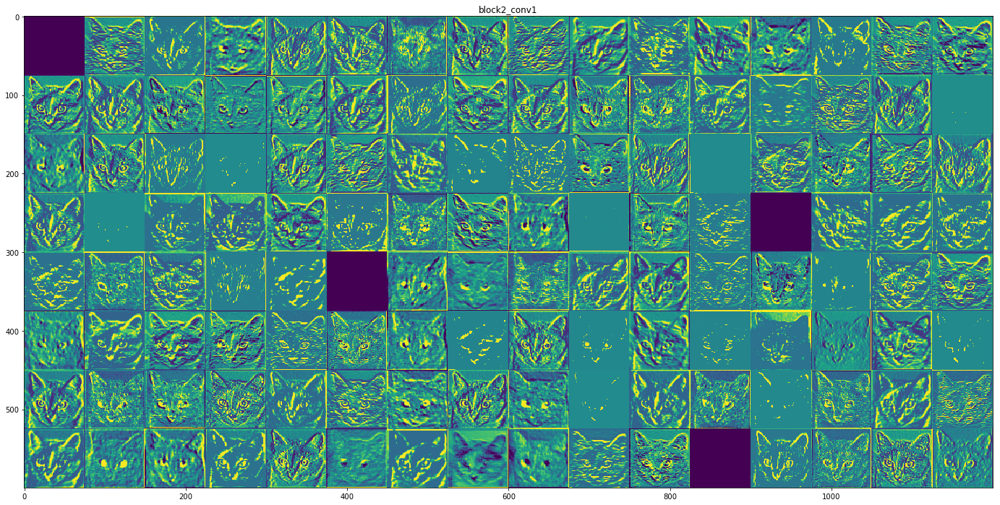

...

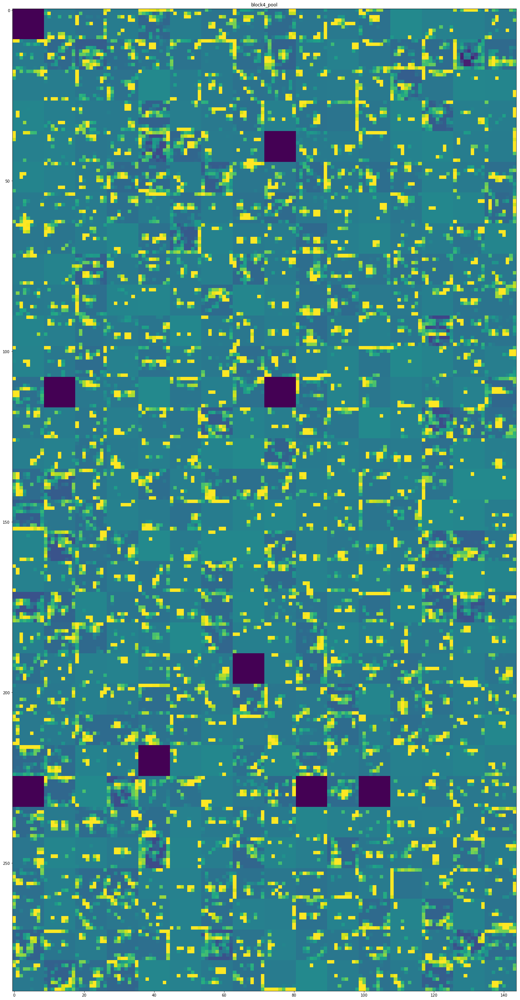

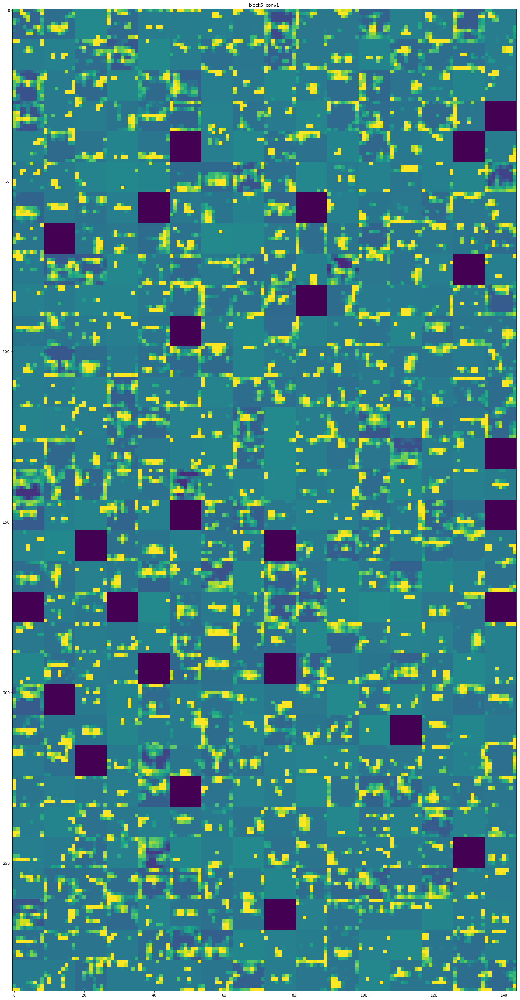

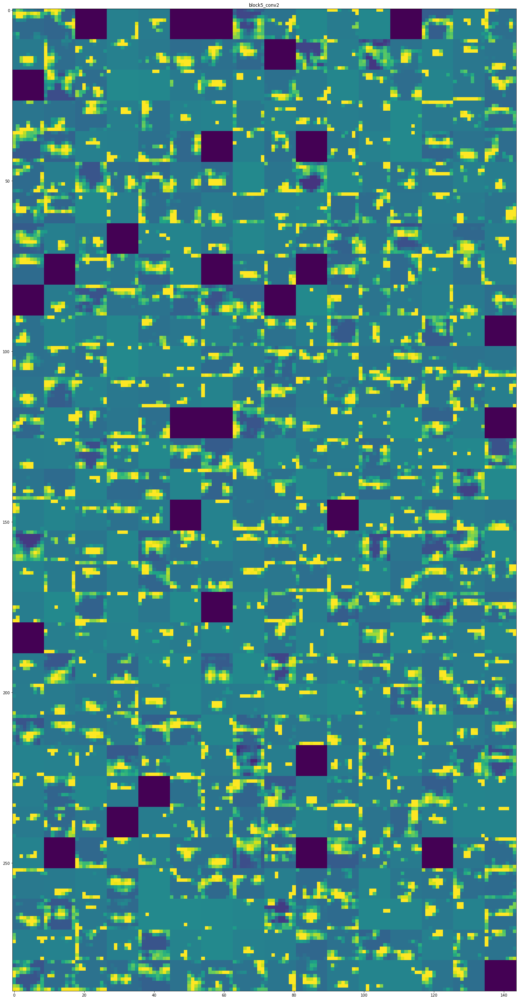

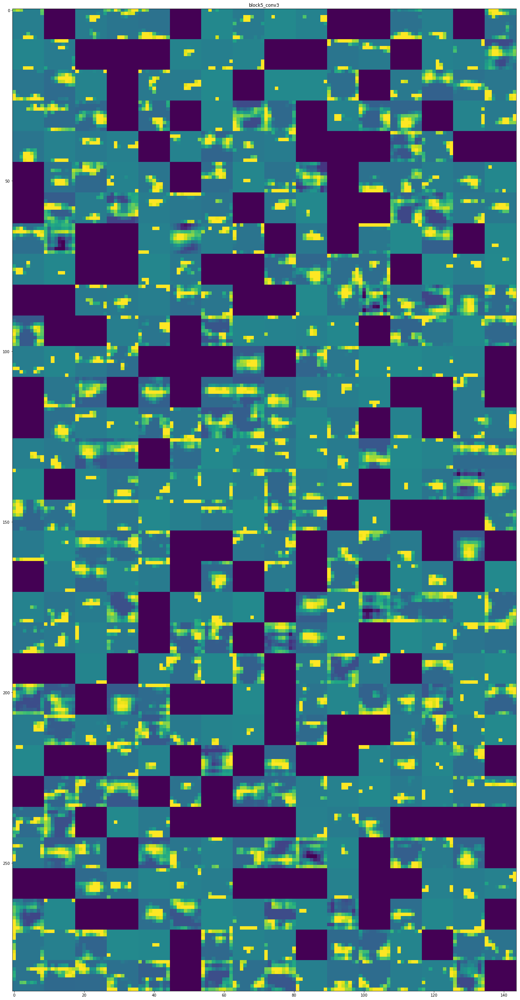

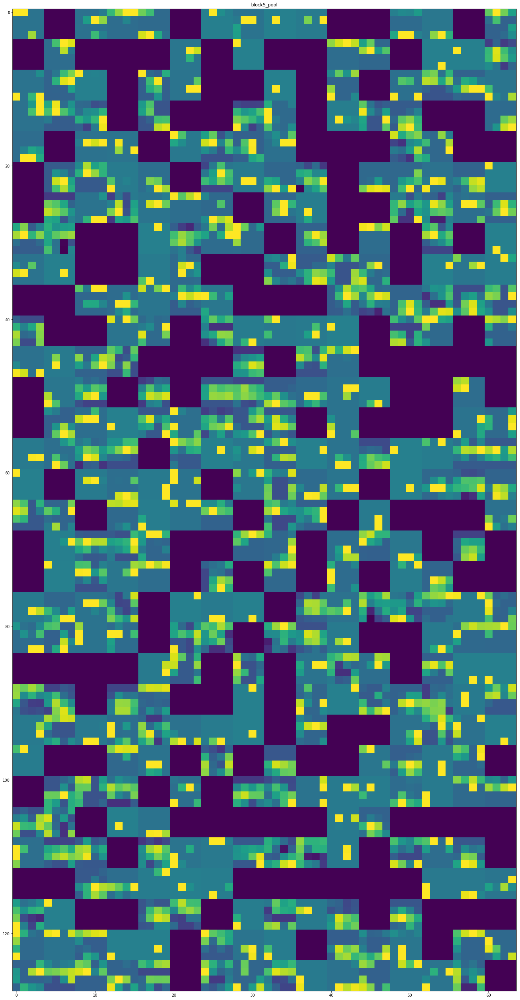

In [23]:
import time

layer_names = [layer.name for layer in vgg16.layers]

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activation_output):
    # Feature map has shape (1 for batch size, kernel_height, kernel_width, n_feature_maps)
    n_feature_maps = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_rows = int(np.ceil(n_feature_maps / images_per_row))
    display_grid = np.zeros((size * n_rows, size * images_per_row))
    for feature_index in range(n_feature_maps):
        row = feature_index // images_per_row
        col = feature_index % images_per_row
        channel_image = layer_activation[0, :, :, feature_index]
        channel_image -= channel_image.mean()
        channel_image /= channel_image.std()
        channel_image *= 64
        channel_image += 128
        channel_image = np.clip(channel_image, 0, 255).astype(np.uint8)
        display_grid[row * size : (row + 1) * size, col * size : (col+1) * size] = channel_image
    scale = 1.5 / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')